In [20]:
import pandas as pd
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.offline as pyo
# Set notebook mode to work in offline
pyo.init_notebook_mode()


In [2]:
df = pd.read_excel('cleaned_data.xlsx', index_col=[0] )

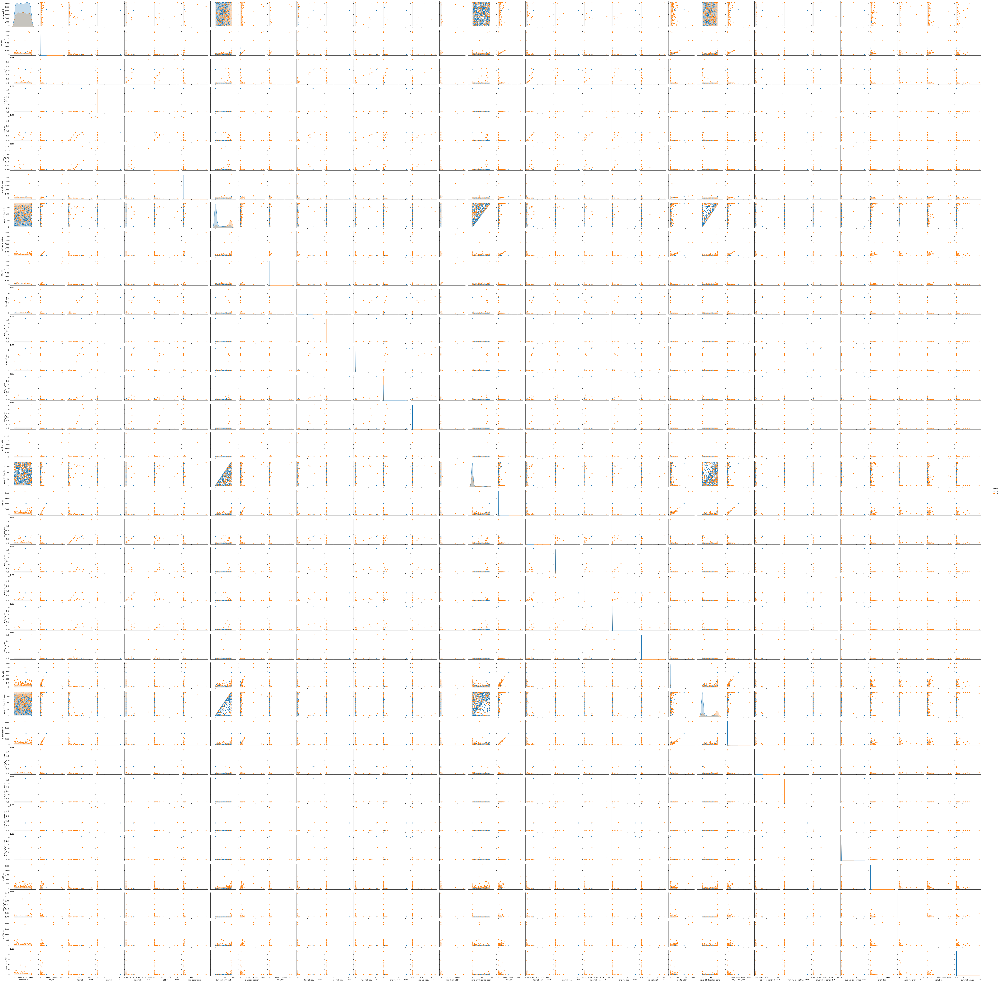

In [4]:
# This takes a looong time to finish execution
sns.pairplot(df, hue='blacklist')

In [17]:
df.columns

Index(['Unnamed: 0', 'focal_addr', 'focal_addr_type', 'blacklist', 'tot_txn',
       'tot_val', 'min_val', 'max_val', 'sd2_val', 'unq_other_addr',
       'days_diff_first_last', 'contract_creation', 'recv_txn', 'tot_val_recv',
       'min_val_recv', 'max_val_recv', 'avg_val_recv', 'sd2_val_recv',
       'unq_from_addr', 'days_diff_first_last_recv', 'sent_txn',
       'tot_val_sent', 'min_val_sent', 'max_val_sent', 'avg_val_sent',
       'sd2_val_sent', 'unq_to_addr', 'days_diff_first_last_sent',
       'to_contract_txn', 'tot_val_to_contract', 'min_val_to_contract',
       'max_val_to_contract', 'avg_val_to_contract', 'erc20_txn',
       'sum_val_erc20', 'erc721_txn', 'sum_val_erc721', 'days_since_last_txn'],
      dtype='object')

In [21]:
labels = df['blacklist'].value_counts().index
values = df['blacklist'].value_counts().values
fig = px.pie(values=values, names=labels, title='Black List Data')
fig.show()

In [22]:
wallet_add = df.where(df["focal_addr_type"] == 'wallet address').blacklist.value_counts().values
contract_add = df.where(df["focal_addr_type"] == 'contract address').blacklist.value_counts().values


fig = make_subplots(rows=1, cols=2, specs=[[{"type": "pie"}, {"type": "pie"}]],
                   subplot_titles=["Wallet Address", "Contract Address"])
fig.update_layout(
    title={
        'text': "Blacklist Distribution Based On Focal Address Type",
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)

fig.update_layout(height=800, width=1000)
fig.update_traces(hole=0.4)

fig.add_trace(go.Pie(
     values=wallet_add,
     labels=labels,
     domain=dict(x=[0, 0.5]),
     name="wallet address"), 
     row=1, col=1)

fig.add_trace(go.Pie(
     values=contract_add,
     labels=labels,
     domain=dict(x=[0.5, 1.0]),
     name="contract address"),
    row=1, col=2)


fig.show()


In [4]:
recv_txn = df.where(df["recv_txn"]>0).blacklist.value_counts().values
sent_txn = df.where(df["sent_txn"]>0).blacklist.value_counts().values
to_contract_txn = df.where(df["to_contract_txn"]>0).blacklist.value_counts().values
erc20_txn = df.where(df["erc20_txn"]>0).blacklist.value_counts().values
erc721_txn = df.where(df["erc721_txn"]>0).blacklist.value_counts().values

fig = make_subplots(rows=3, cols=2, specs=[[{"type": "pie"}, {"type": "pie"}],
                                          [{"type": "pie"}, {"type": "pie"}],
                                          [{"type": "pie"}, {"type": "pie"}]],
                   subplot_titles=["Received Transactions", "Sent Transactions",
                                    "Contract Transactions", "ERC20 Transactions",
                                    "ERC721 Transactions"])
fig.update_layout(
    title={
        'text': "Blacklist Distribution Based On Transaction Type",
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)

fig.update_layout(height=800, width=1000)
fig.update_traces(hole=0.4)

fig.add_trace(go.Pie(
     values=recv_txn,
     labels=labels,
     domain=dict(x=[0, 0.5]),
     name="received transactions"), 
     row=1, col=1)

fig.add_trace(go.Pie(
     values=sent_txn,
     labels=labels,
     domain=dict(x=[0.5, 1.0]),
     name="sent transactions"),
    row=1, col=2)


fig.add_trace(go.Pie(
     values=to_contract_txn,
     labels=labels,
     domain=dict(x=[0, 0.5]),
     name="Contract transactions"),
    row=2, col=1)

fig.add_trace(go.Pie(
     values=erc20_txn,
     labels=labels,
     domain=dict(x=[0.5, 1.0]),
     name="ERC20 transactions"),
    row=2, col=2)

fig.add_trace(go.Pie(
     values=erc721_txn,
     labels=labels,
     domain=dict(x=[0.5, 1.0]),
     name="ERC721 transactions"),
    row=3, col=1)

fig.show()


## Contract transactions are blacklisted significantly higher, followed by sent transactions and ERC20 

In [6]:
px.box(df[["tot_txn",'recv_txn', 'sent_txn','to_contract_txn','erc20_txn', 'erc721_txn','blacklist']], color="blacklist")


In [8]:
px.box(df[["tot_val_sent", 'tot_val_recv', 'tot_val_to_contract', 'blacklist']], color="blacklist")


In [9]:
px.box(df[['sum_val_erc20', 'sum_val_erc721','blacklist']], color="blacklist")


In [16]:
px.box(df[['min_val',"min_val_recv", 'min_val_sent', 'min_val_to_contract', 'blacklist']], color="blacklist")


In [11]:
px.box(df[['unq_other_addr', 'blacklist']], color="blacklist")


In [12]:
px.box(df[['tot_val', 'max_val', 'blacklist']], color="blacklist")


In [13]:
px.box(df[['days', 'blacklist']], color="blacklist")


In [ ]:
Index(['Unnamed: 0', 'focal_addr', 'focal_addr_type', 'blacklist', 'tot_txn',
       'tot_val', 'min_val', 'max_val', 'sd2_val', 'unq_other_addr',
       'days_diff_first_last', 'contract_creation', 'recv_txn', 'tot_val_recv',
       'min_val_recv', 'max_val_recv', 'avg_val_recv', 'sd2_val_recv',
       'unq_from_addr', 'days_diff_first_last_recv', 'sent_txn',
       'tot_val_sent', 'min_val_sent', 'max_val_sent', 'avg_val_sent',
       'sd2_val_sent', 'unq_to_addr', 'days_diff_first_last_sent',
       'to_contract_txn', 'tot_val_to_contract', 'min_val_to_contract',
       'max_val_to_contract', 'avg_val_to_contract', 'erc20_txn',
       'sum_val_erc20', 'erc721_txn', 'sum_val_erc721', 'days_since_last_txn'],
      dtype='object')

In [25]:
px.box(df[['days_diff_first_last','days_diff_first_last_recv', 'days_diff_first_last_sent', 'days_since_last_txn','blacklist']], color="blacklist")
